# IMA PROJECT: Automatic Color Correction

This project consists of the implementation of ACE (Automatic Color Correction) algorithm.

The notebook presents first the implemetation of this algorithm and then it shows the results of multiple tests applying ACE on diffirent images.



## Group members:
Adnane ELBOUHALI 

NourElhouda KLICH 

## Supervising professor:
Christophe Kervazo


## Importing libraries

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
from PIL import Image, ImageStat
import os
import cv2

## 1. Computing the visual appearance
### 1.1 Chromatic/Spatial adjusment
####  Global/local weight: the d(.) function

In [ ]:
def d(dx, dy, distance_type='euclidean', alpha=0.1):
    if distance_type == 'euclidean':
        return np.sqrt(dx ** 2 + dy ** 2)
    elif distance_type == 'manhattan':
        return dx + dy
    elif distance_type == 'inverse_exponential':
        return (1/np.exp(-alpha* np.sqrt(dx ** 2 + dy ** 2)))
    elif distance_type == 'maximum':
        return np.maximum(dx, dy)
    else:
        raise ValueError("Give a distance type!")
## test
dx = 3
dy = 4
dist = d(dx, dy,'euclidean')
print("Euclidean distance:",dist)

Euclidean distance: 5.0


#### Tuning the contrast: the relative lightness appearance function r(.)

In [ ]:
def r(diff_lum, name, slope=20,threshold=0.2):
    if name == "linear":
        return diff_lum
    elif name == "signum":
        return np.sign(diff_lum)
    elif name == "saturation":
        if slope < 1:
            raise ValueError("Five a valid slope for saturation function")
        return np.minimum(1.0, np.maximum(diff_lum/slope,-1.0))
    else:
        raise ValueError("Give a valid name for r(.) function! ")

##### Tests for r(.) function

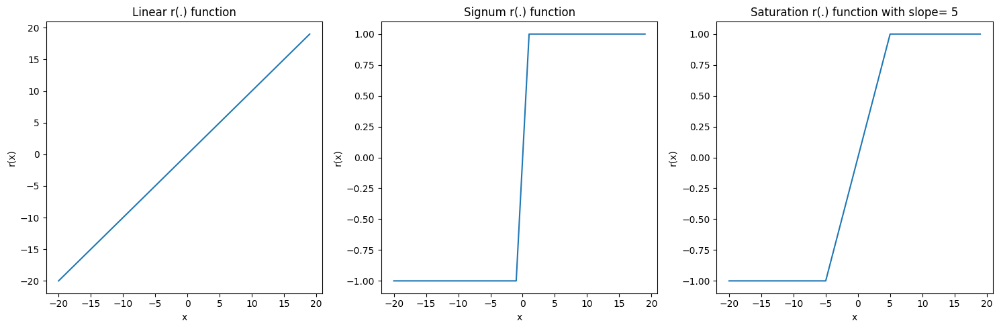

In [ ]:
X= np.arange(-20,20)

plt.figure(figsize=(15,5))

##Linear
plt.subplot(1,3,1)
plt.plot(X,r(X,"linear"))
plt.title("Linear r(.) function")
plt.xlabel("x")
plt.ylabel("r(x)")

##signum
plt.subplot(1,3,2)
plt.plot(X,r(X,"signum"))
plt.title("Signum r(.) function")
plt.xlabel("x")
plt.ylabel("r(x)")

##saturation
plt.subplot(1,3,3)
plt.plot(X,r(X,"saturation",5))
plt.title("Saturation r(.) function with slope= 5")
plt.xlabel("x")
plt.ylabel("r(x)")

plt.tight_layout()
plt.show()

##### Maximum value of r(.) functions: rmax()

In [ ]:
def rmax(name):  ##
    return 1

#### The output R of chromatic/spatial adjusment

\begin{equation}
Rc(p) = \frac{\sum_{j \in Subset, j \neq p} \left[ r(Ic(p) - Ic(j)) / d(p, j) \right]}{\sum_{j \in Subset, j \neq p} \left[ rmax / d(p, j) \right]}
\end{equation}

In [ ]:

def Rc_p(p, c, distance, Ic, r_name): ## calculate Rc for one pixel
    p0, p1 = p
    height, width = Ic.shape[:2]
    if Ic.shape[2] == 3:

        I = np.interp(Ic[:, :, c], (Ic[:, :, c].min(), Ic[:, :, c].max()), (0, 1))
    else:
        I = Ic / Ic.max()


    j0, j1 = np.indices((height, width))

    mask = (j0 != p0) | (j1 != p1)
    dx_p_j = np.abs(p0 - j0)
    dy_p_j = np.abs(p1 - j1)

    numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
    denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]
    numerator = numerators.sum()
    denominator = denominators.sum()

    return numerator / denominator

def Rc_image(input_image, distance,r_name):
    Ic = plt.imread(input_image)
    if Ic.ndim == 2:
        Ic = Ic[:, :, np.newaxis]
    Rc=np.zeros((Ic.shape[0],Ic.shape[1],Ic.shape[2]))
    for c in range(3):
        for p0 in range(Ic.shape[0]):
            for p1 in range(Ic.shape[1]):
                Rc[p0][p1][c] = Rc_p((p0,p1), c,distance, Ic, r_name)
    return Rc

### 1.2 Dynamic tone reproduction scaling
#### Calculating the slope

In [ ]:
def Sc(mc, Mc):
    if Mc == mc:
        raise ValueError("Division par zero: Le pixel minimum et maximum ont la même valeur.")
    slope = 255.0 / (Mc - mc)
    return slope

#### Linear scaling

$$ O_c(p) = \text{round}\left(\frac{s_c(R_c(p))}{m_c}\right)$$

In [ ]:
def linear_scaling_Oc(Rc):
  Oc=np.zeros((Rc.shape[0],Rc.shape[1],3))
  for c in range(3):
    Mc=Rc[:,:,c].max()
    mc=Rc[:,:,c].min()
    slope = Sc(mc,Mc)
    for p0 in range(Rc.shape[0]):
      for p1 in range(Rc.shape[1]):
          if Rc.ndim == 2:  #l'image est en niveaux de gris (1 canal)
              Oc[p0][p1] = round(Sc(mc,Mc)*(Rc[p0][p1]-mc)) ##formule de Oc_p
          else:  # Image en couleurs (3 canaux)
              Oc[p0][p1][c] = round(Sc(mc,Mc)*(Rc[p0][p1][c]-mc)) ##formule de Oc_p

  return Oc.astype("int32")

#### White Patch/Gray World scaling

$$ O_c(p) = \text{round}\left(127.5 + sc \cdot Rc(p)\right)
$$

In [ ]:
def whiteGray_Oc(Rc):
    Oc = np.zeros((Rc.shape[0],Rc.shape[1],3))
    for c in range(3):
        Mc = Rc[:,:,c].max()
        mc = Rc[:,:,c].min()
        for p0 in range(Rc.shape[0]):
            for p1 in range(Rc.shape[1]):
                if Rc.ndim == 2:  #l'image est en niveaux de gris (1 canal)
                      Oc[p0][p1] = round(127.5 + Sc(mc, Mc) * Rc[p0][p1])
                else:  # Image en couleurs (3 canaux)
                    Oc[p0][p1][c] = round(127.5 + Sc(mc, Mc) * Rc[p0][p1][c])
    return Oc.astype("int32")

### Tests on different images

#### Verification function of Grey World/White Patch conditions

In [ ]:
def verification(image):
  b, g, r = cv2.split(image)
  mean_r = np.mean(r)
  mean_g = np.mean(g)
  mean_b = np.mean(b)

  threshold = 20
  is_gray_world= (abs(mean_r - mean_g) < threshold) and (abs(mean_g - mean_b) < threshold)
  brightest_pixel = np.amax(image)
  is_white_patch = all(brightest_pixel == channel_max for channel_max in [255, 255, 255])

  if is_gray_world and is_white_patch:
    print("L'image satisfait la condition Gray World / white Patch.")
  else:
    print("L'image ne satisfait pas la condition Gray World / White Patch.")




#### Testing the output for different r(.) and a fixed d(.), euclidean

In [ ]:
image_file1 = 'content/image200.jpg'
image1=plt.imread(image_file1)
verification(image1)

L'image satisfait la condition Gray World / white Patch.


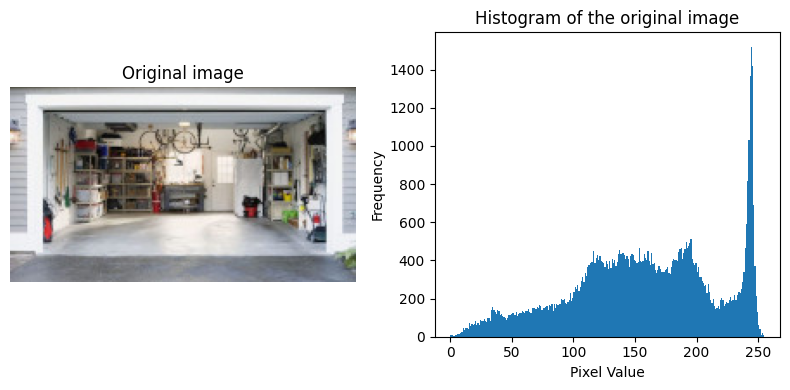

In [ ]:
image_file1 = 'content/image200.jpg'
image1=plt.imread(image_file1)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image1)
plt.title("Original image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.hist(image1.reshape((-1,)),bins=255)
plt.title("Histogram of the original image")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

with function r:  linear


<ipython-input-29-fecd826f7abc>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-29-fecd826f7abc>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


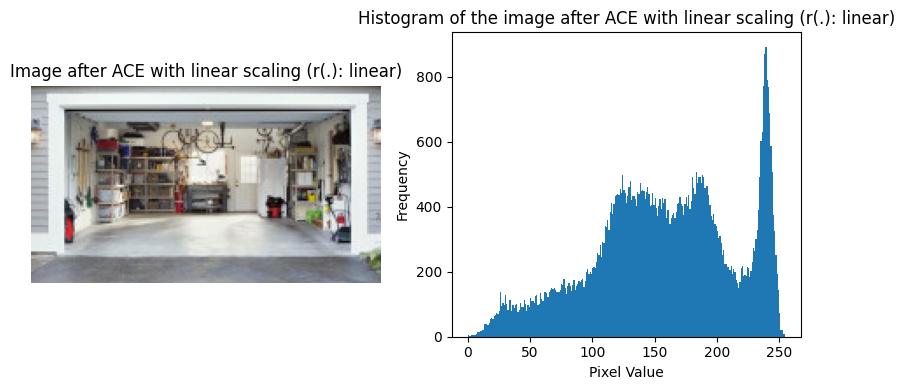

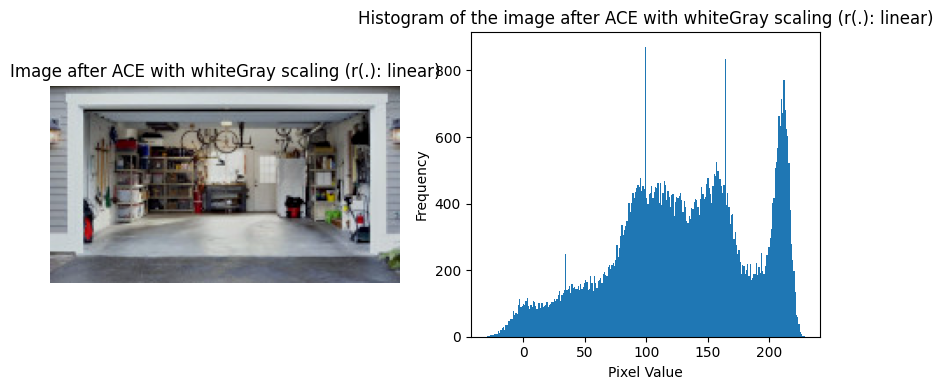

with function r:  signum


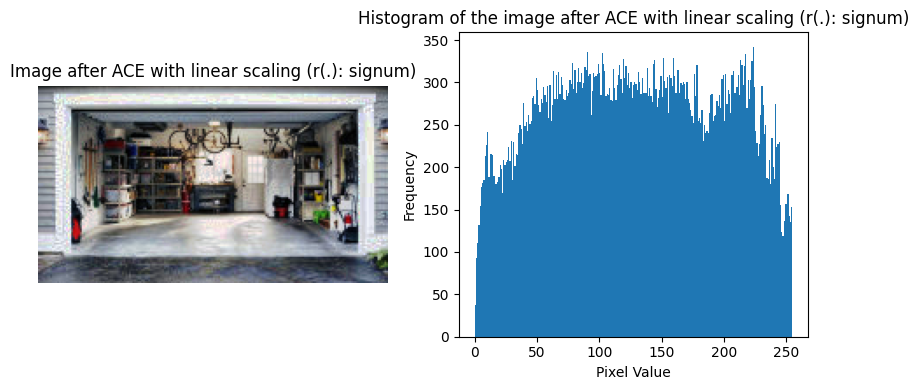

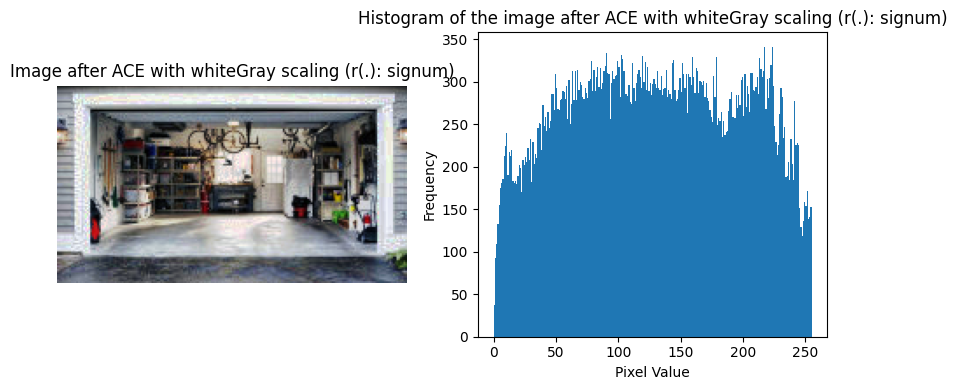

with function r:  saturation


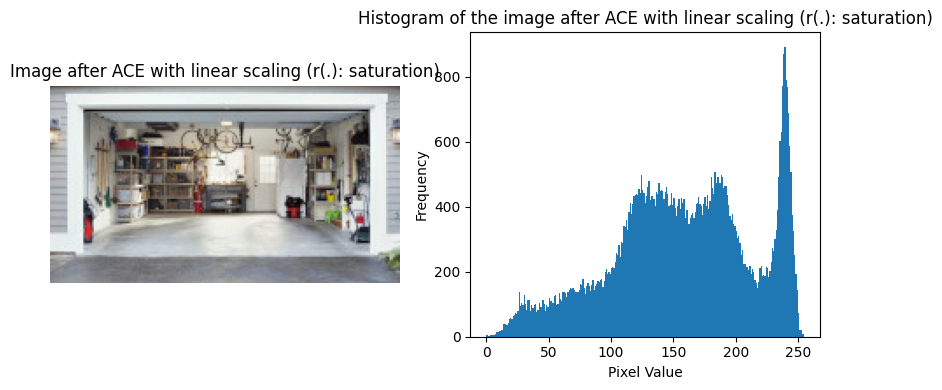

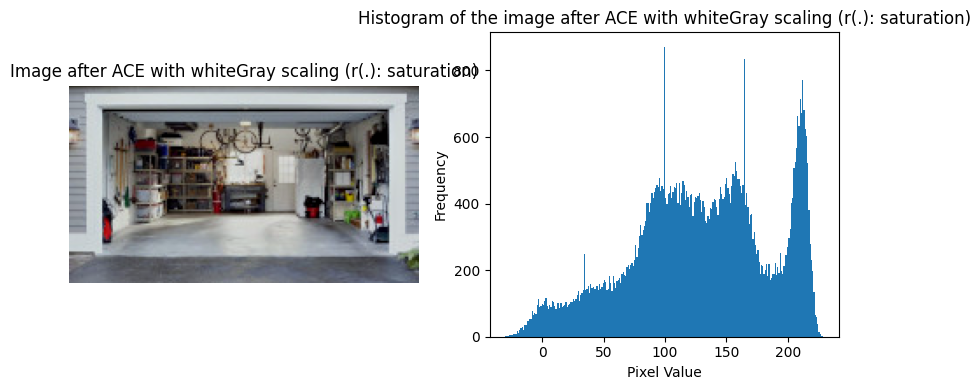

In [ ]:
r_function_names = ['linear', 'signum', 'saturation']

for r_function_name in r_function_names:
    print("with function r: ",r_function_name)
    Rc = Rc_image(image_file1, 'euclidean', r_function_name)

    #Plot Oc with linear scaling
    Oc1 = linear_scaling_Oc(Rc)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(Oc1)
    plt.title(f"Image after ACE with linear scaling (r(.): {r_function_name})")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.hist(Oc1.reshape((-1,)),bins=255)
    plt.title(f"Histogram of the image after ACE with linear scaling (r(.): {r_function_name})")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

    #Plot Oc with whiteGray scaling
    Oc2=whiteGray_Oc(Rc)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(Oc2)
    plt.title(f"Image after ACE with whiteGray scaling (r(.): {r_function_name})")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.hist(Oc2.reshape((-1,)),bins=255)
    plt.title(f"Histogram of the image after ACE with whiteGray scaling (r(.): {r_function_name})")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

#### Testing the output for different d(.) and a fixed r(.), signum

In [ ]:
image_file1 = 'content/image200_diff_d.jpg'
image1=plt.imread(image_file1)
verification(image1)

L'image satisfait la condition Gray World / white Patch.


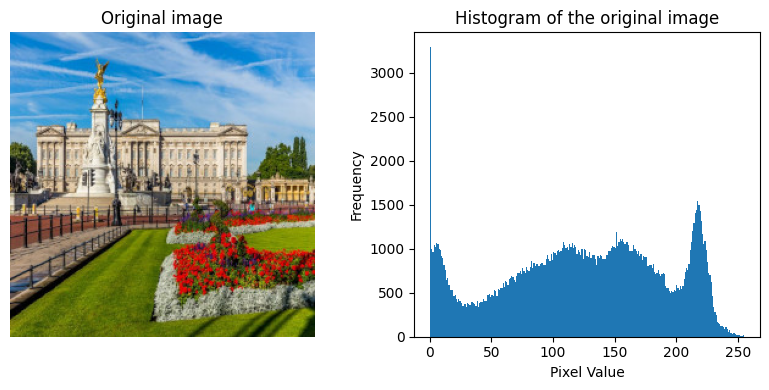

In [ ]:
image_file1 = 'content/image200_diff_d.jpg'
image1=plt.imread(image_file1)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image1)
plt.title("Original image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.hist(image1.reshape((-1,)),bins=255)
plt.title("Histogram of the original image")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

with function d:  euclidean


<ipython-input-7-6d0d8d93c75b>:12: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-7-6d0d8d93c75b>:13: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


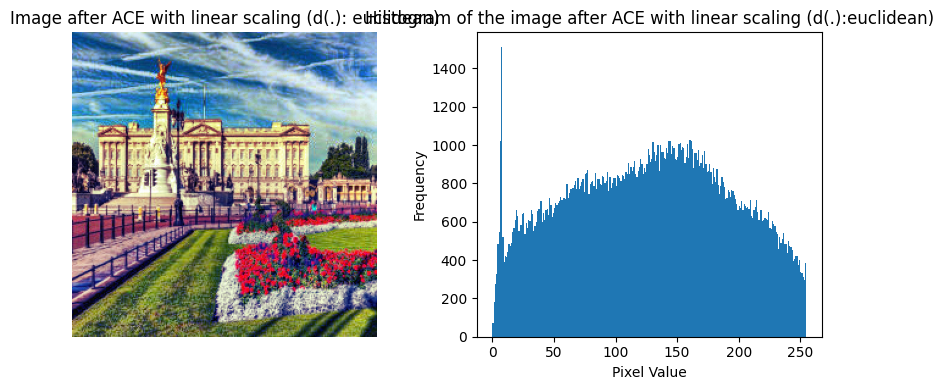

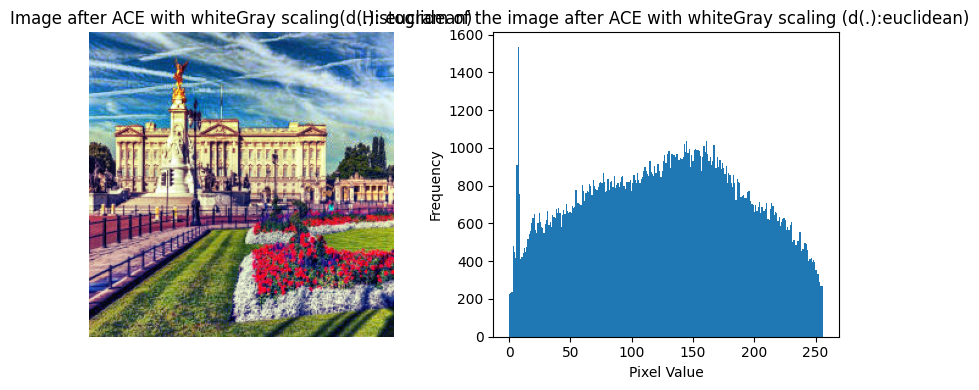

with function d:  inverse_exponential


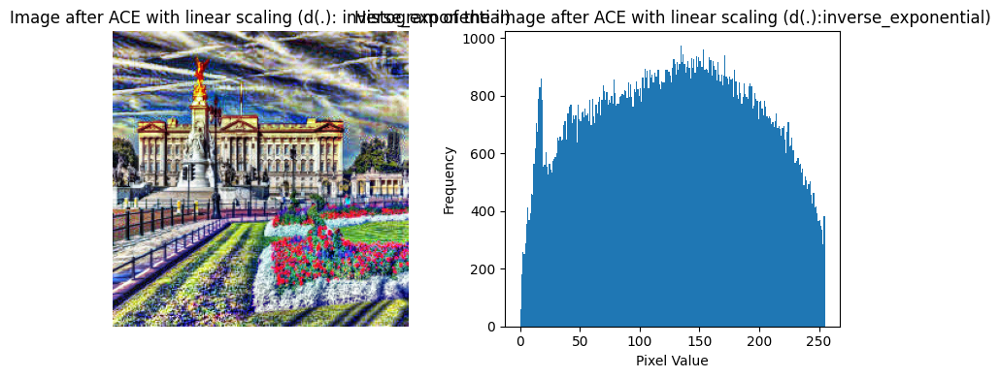

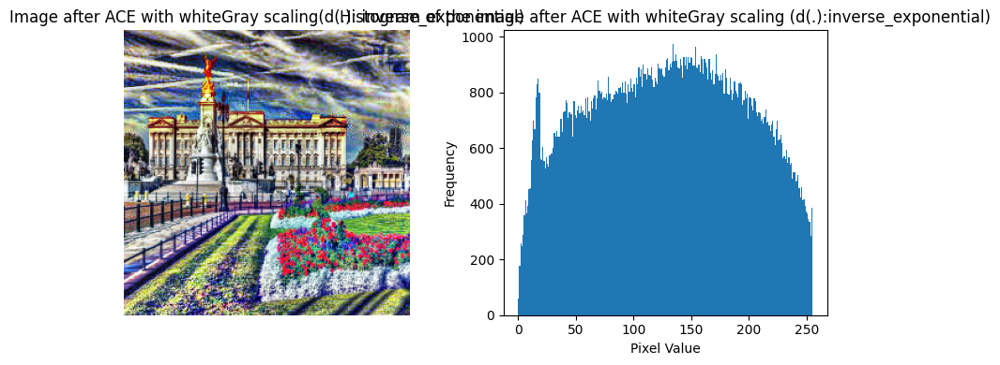

with function d:  manhattan


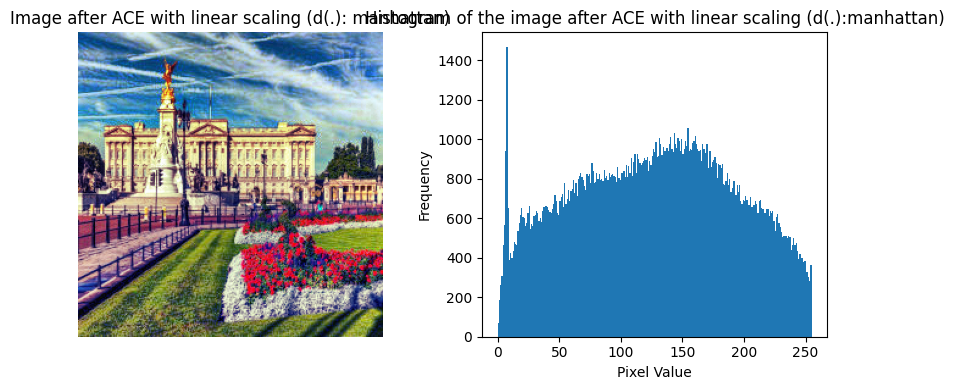

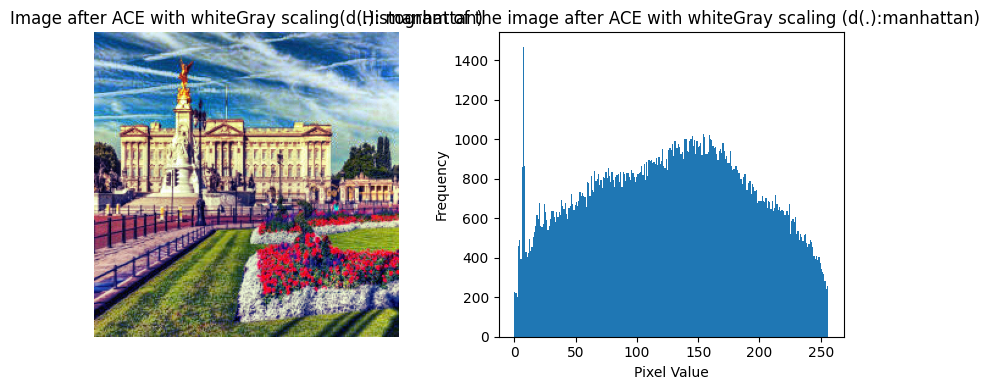

with function d:  maximum


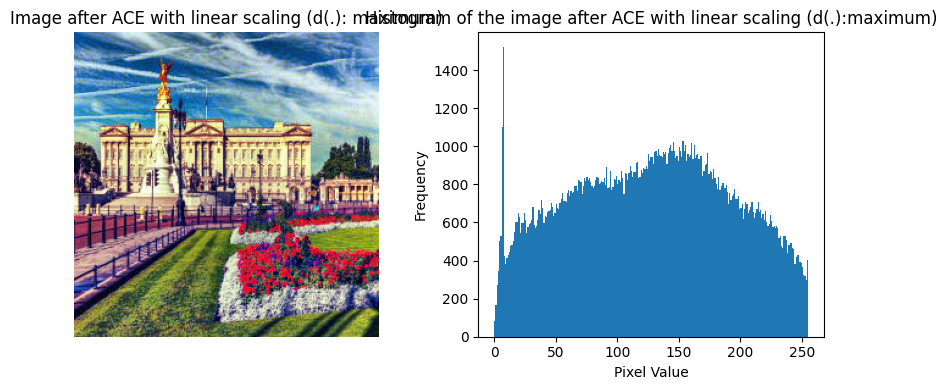

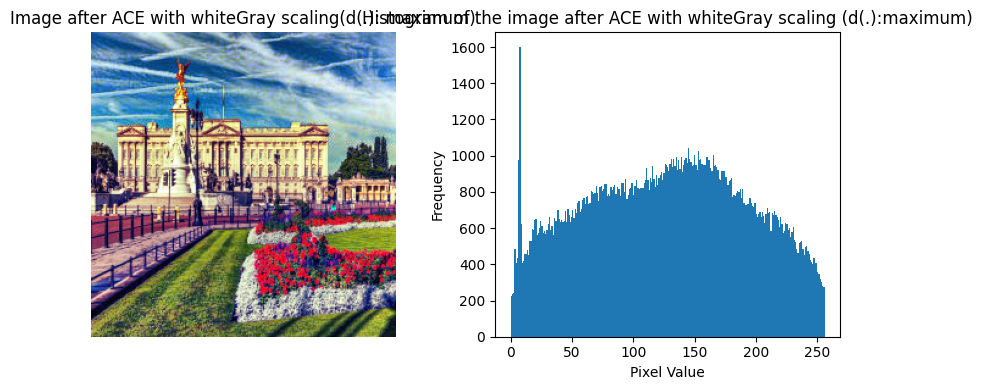

In [ ]:
d_function_names=['euclidean','inverse_exponential','manhattan','maximum']

for d_function_name in d_function_names:
    print("with function d: ",d_function_name)
    Rc = Rc_image(image_file1, d_function_name, "signum")

    #Plot Oc with linear scaling
    Oc1 = linear_scaling_Oc(Rc)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(Oc1)
    plt.title(f"Image after ACE with linear scaling (d(.): {d_function_name})")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.hist(Oc1.reshape((-1,)),bins=255)
    plt.title(f"Histogram of the image after ACE with linear scaling (d(.):{d_function_name})")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

    #Plot Oc with whiteGray scaling
    Oc2=whiteGray_Oc(Rc)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(Oc2)
    plt.title(f"Image after ACE with whiteGray scaling(d(.): {d_function_name})")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.hist(Oc2.reshape((-1,)),bins=255)
    plt.title(f"Histogram of the image after ACE with whiteGray scaling (d(.):{d_function_name})")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")

    plt.tight_layout()
    plt.show()

#### Testing different images with functions r: signum and d: euclidean
##### * image 1

<ipython-input-74-caf8c5a9b193>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-74-caf8c5a9b193>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


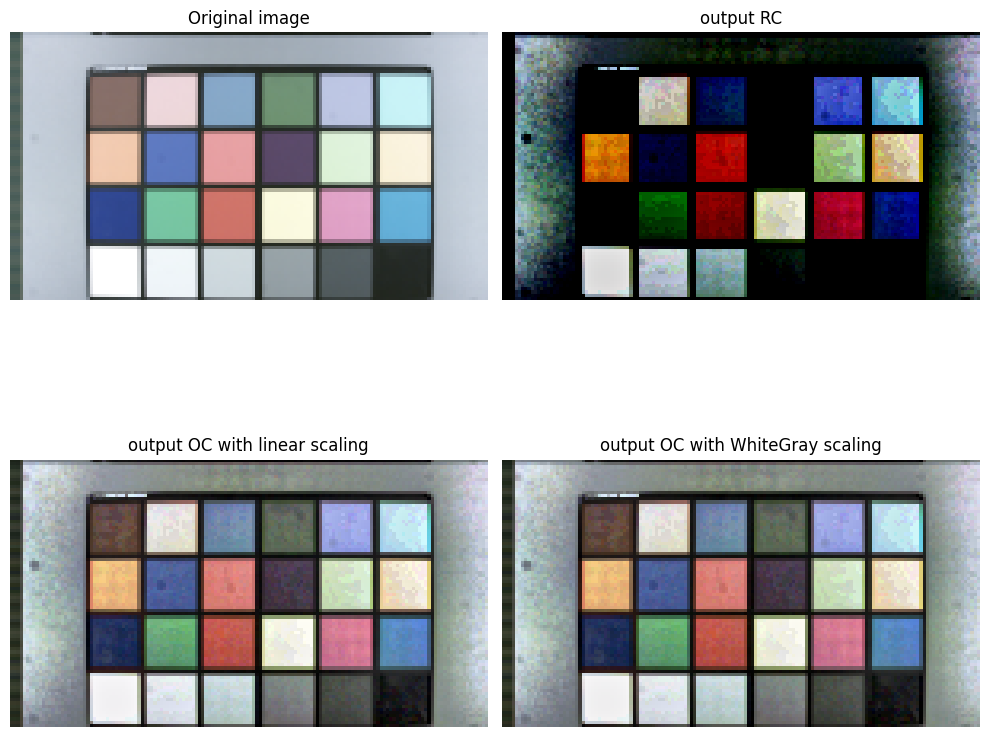

In [ ]:
image_file = 'content/image_150.png'
image=plt.imread(image_file)

# Create a figure and a 2x2 grid of subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))

# Display images
ax1.imshow(image)
ax1.set_title("Original image")
ax1.axis('off')

Rc = Rc_image(image_file, "euclidean", "signum")
ax2.imshow(Rc)
ax2.set_title("output RC")
ax2.axis('off')

Oc1 = linear_scaling_Oc(Rc)
ax3.imshow(Oc1)
ax3.set_title("output OC with linear scaling")
ax3.axis('off')

Oc2 = whiteGray_Oc(Rc)
ax4.imshow(Oc2)
ax4.set_title("output OC with WhiteGray scaling")
ax4.axis('off')


plt.tight_layout()


plt.show()

##### * image 2

<ipython-input-74-caf8c5a9b193>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-74-caf8c5a9b193>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


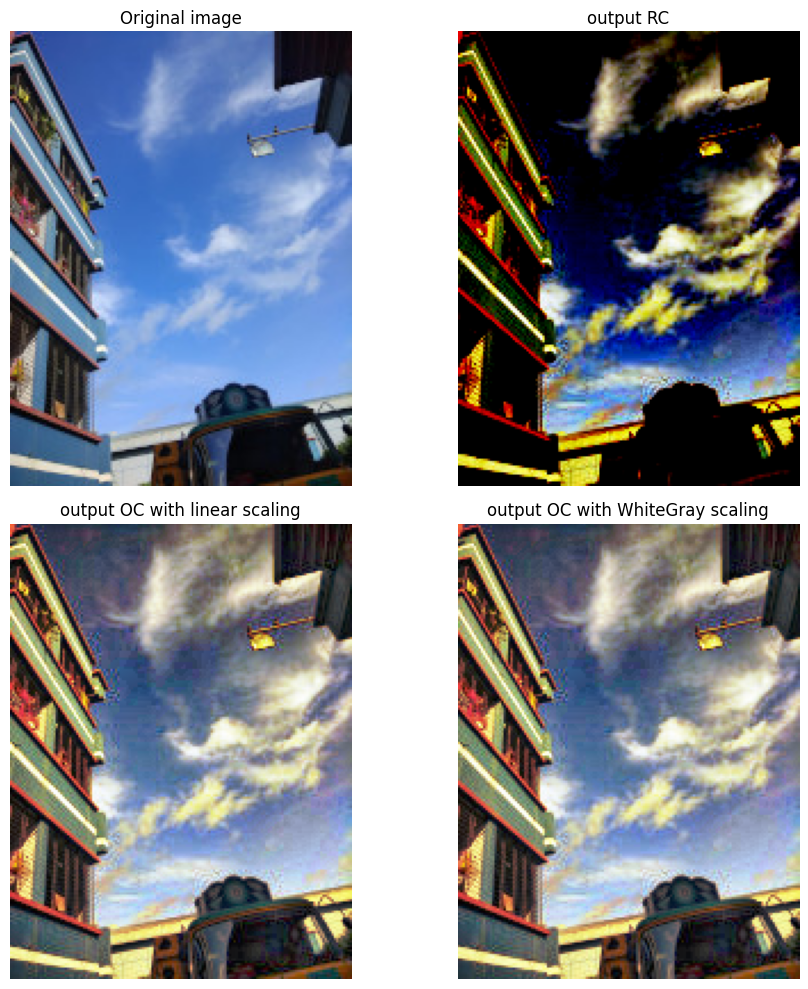

In [ ]:
image_file = 'content/image_200.jpg'
image=plt.imread(image_file)

# Create a figure and a 2x2 grid of subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))

# Display images
ax1.imshow(image)
ax1.set_title("Original image")
ax1.axis('off')

Rc = Rc_image(image_file, "euclidean", "signum")
ax2.imshow(Rc)
ax2.set_title("output RC")
ax2.axis('off')

Oc1 = linear_scaling_Oc(Rc)
ax3.imshow(Oc1)
ax3.set_title("output OC with linear scaling")
ax3.axis('off')

Oc2 = whiteGray_Oc(Rc)
ax4.imshow(Oc2)
ax4.set_title("output OC with WhiteGray scaling")
ax4.axis('off')

plt.tight_layout()

plt.show()

##### * image 3

In [ ]:
image_file = 'content/image_250.jpg'
image=plt.imread(image_file)
verification(image)

L'image satisfait la condition Gray World / white Patch.


<ipython-input-74-caf8c5a9b193>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-74-caf8c5a9b193>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


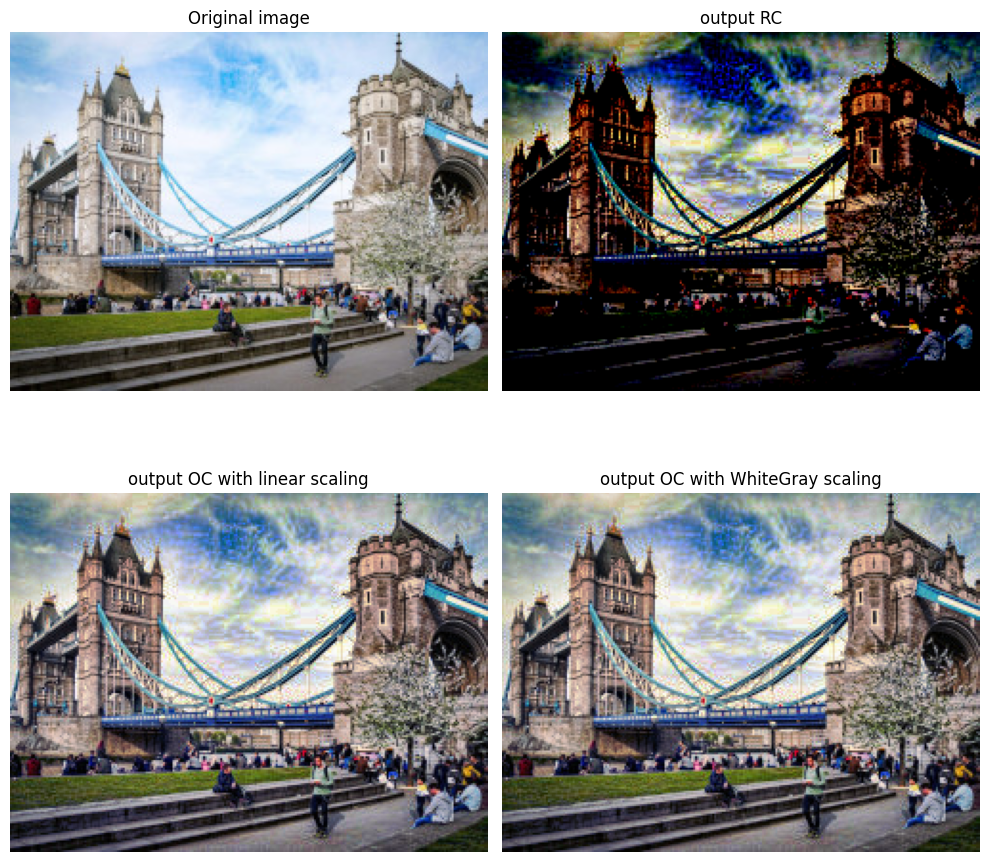

In [ ]:
image_file = 'content/image_250.jpg'
image=plt.imread(image_file)

# Create a figure and a 2x2 grid of subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))

# Display images
ax1.imshow(image)
ax1.set_title("Original image")
ax1.axis('off')

Rc = Rc_image(image_file, "euclidean", "signum")
ax2.imshow(Rc)
ax2.set_title("output RC")
ax2.axis('off')

Oc1 = linear_scaling_Oc(Rc)
ax3.imshow(Oc1)
ax3.set_title("output OC with linear scaling")
ax3.axis('off')

Oc2 = whiteGray_Oc(Rc)
ax4.imshow(Oc2)
ax4.set_title("output OC with WhiteGray scaling")
ax4.axis('off')

plt.tight_layout()

plt.show()

##### * image 4

<ipython-input-74-caf8c5a9b193>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-74-caf8c5a9b193>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


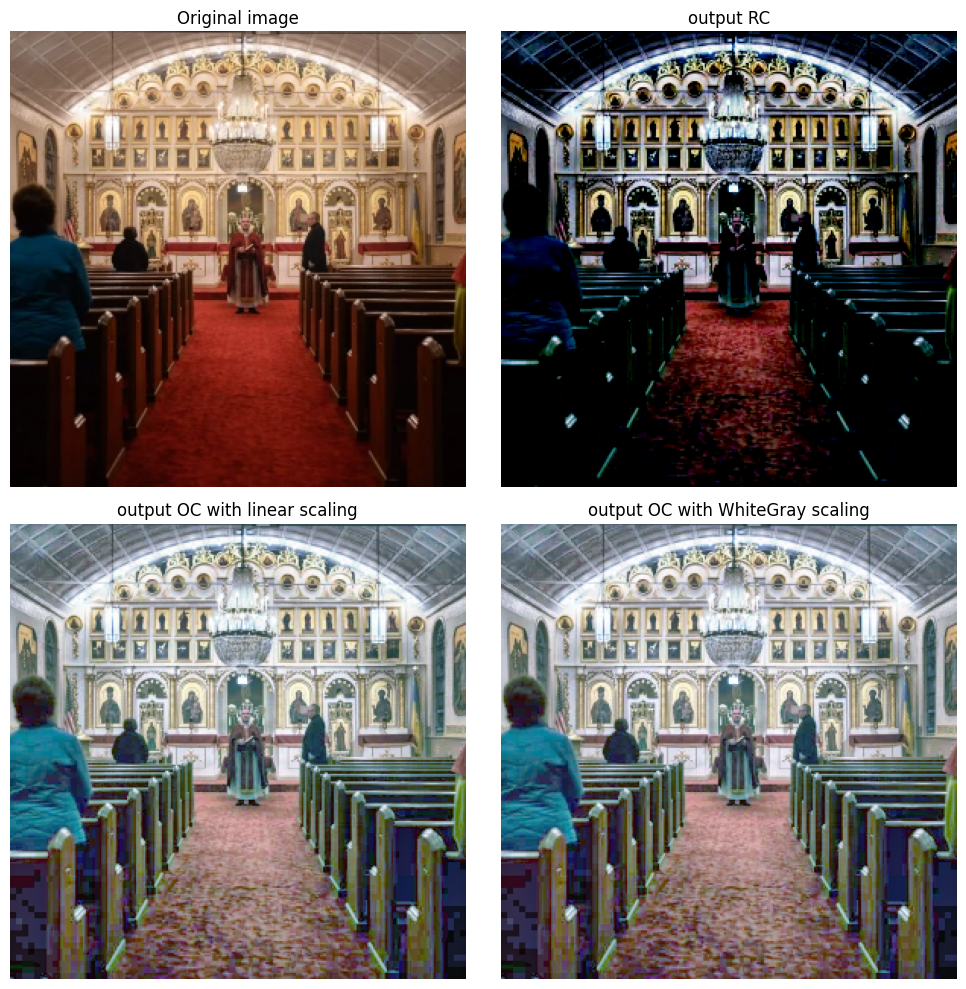

In [ ]:
image_file = 'content/image300.webp'
image=plt.imread(image_file)

# Create a figure and a 2x2 grid of subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))

# Display images
ax1.imshow(image)
ax1.set_title("Original image")
ax1.axis('off')

Rc = Rc_image(image_file, "euclidean", "signum")
ax2.imshow(Rc)
ax2.set_title("output RC")
ax2.axis('off')

Oc1 = linear_scaling_Oc(Rc)
ax3.imshow(Oc1)
ax3.set_title("output OC with linear scaling")
ax3.axis('off')

Oc2 = whiteGray_Oc(Rc)
ax4.imshow(Oc2)
ax4.set_title("output OC with WhiteGray scaling")
ax4.axis('off')

plt.tight_layout()
plt.show()

##### * image 5

<ipython-input-74-caf8c5a9b193>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-74-caf8c5a9b193>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


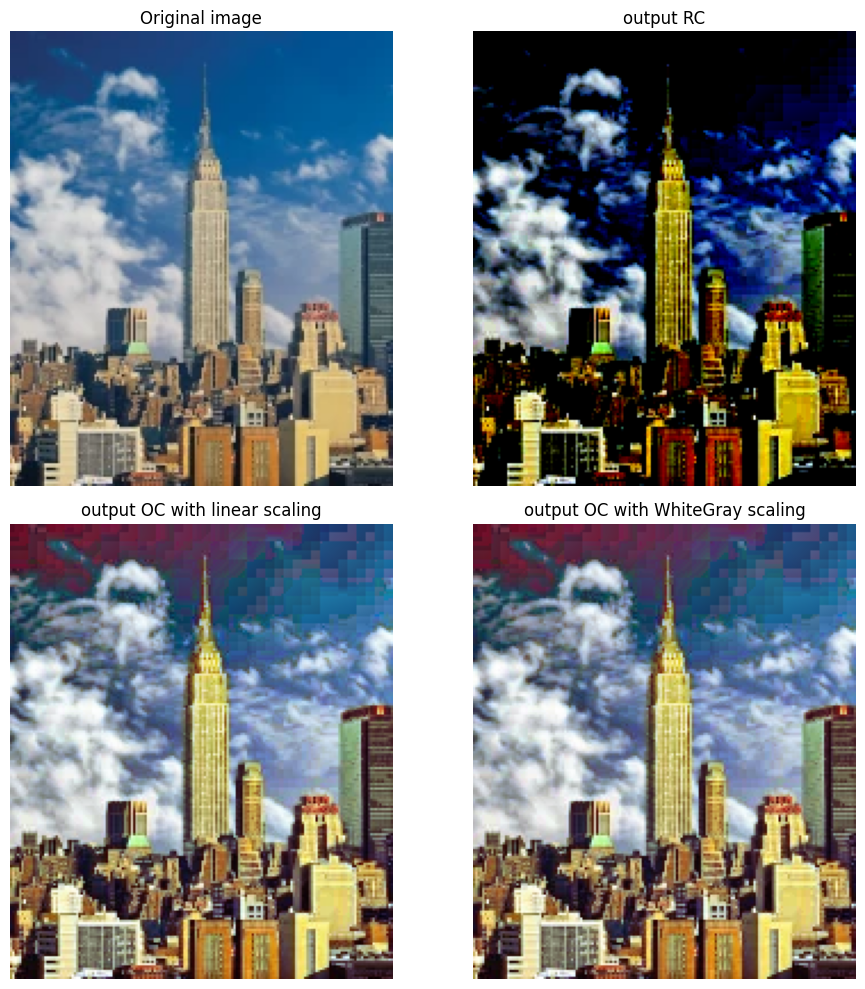

In [ ]:
image_file = 'content/image20000.webp'
image=plt.imread(image_file)

# Create a figure and a 2x2 grid of subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))

# Display images
ax1.imshow(image)
ax1.set_title("Original image")
ax1.axis('off')

Rc = Rc_image(image_file, "euclidean", "signum")
ax2.imshow(Rc)
ax2.set_title("output RC")
ax2.axis('off')

Oc1 = linear_scaling_Oc(Rc)
ax3.imshow(Oc1)
ax3.set_title("output OC with linear scaling")
ax3.axis('off')

Oc2 = whiteGray_Oc(Rc)
ax4.imshow(Oc2)
ax4.set_title("output OC with WhiteGray scaling")
ax4.axis('off')

plt.tight_layout()
plt.show()

## 3. ACE filtering characteristics
### 3.1. Lightness constancy and dynamic modification

<ipython-input-96-caf8c5a9b193>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-96-caf8c5a9b193>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


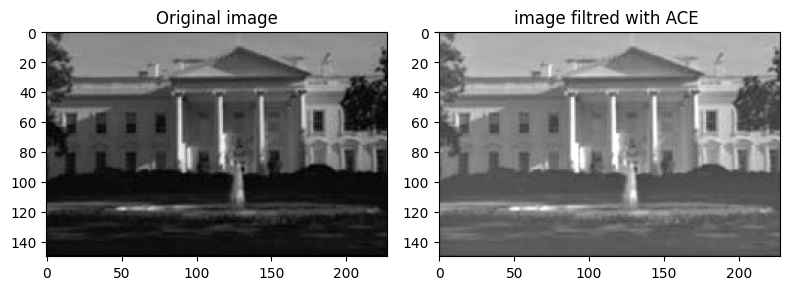

In [ ]:
image_file = 'content/image-007.jpg'
image=plt.imread(image_file)
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original image")

Rc = Rc_image(image_file, "euclidean", "saturation")
Oc = whiteGray_Oc(Rc)
plt.subplot(1, 2, 2)
plt.imshow(Oc)
plt.title("image filtred with ACE ")

plt.tight_layout()
plt.show()

<ipython-input-96-caf8c5a9b193>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-96-caf8c5a9b193>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


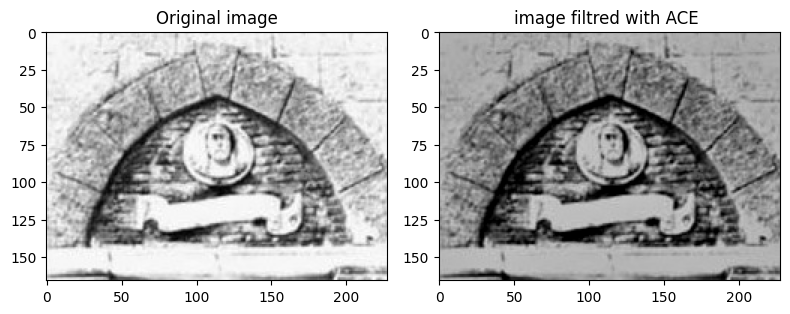

In [ ]:
image_file = 'content/image-001.jpg'
image=plt.imread(image_file)
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original image")


Rc = Rc_image(image_file, "euclidean", "saturation")
Oc = whiteGray_Oc(Rc)
plt.subplot(1, 2, 2)
plt.imshow(Oc)
plt.title("image filtred with ACE ")
plt.tight_layout()
plt.show()

<ipython-input-96-caf8c5a9b193>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-96-caf8c5a9b193>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


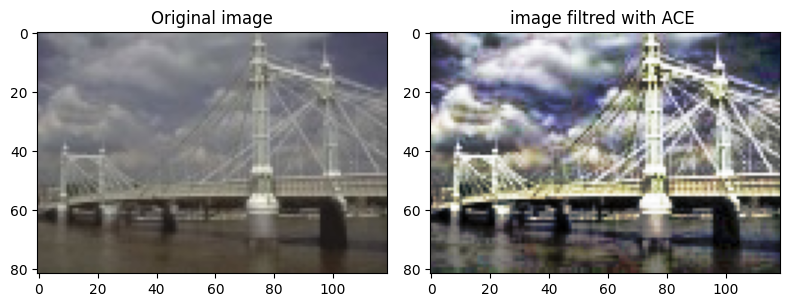

In [ ]:
image_file = 'content/test-62.jpg'
image=plt.imread(image_file)
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original image")

Rc = Rc_image(image_file, "euclidean", "signum")
Oc = whiteGray_Oc(Rc)
plt.subplot(1, 2, 2)
plt.imshow(Oc)
plt.title("image filtred with ACE ")

plt.tight_layout()
plt.show()

### 3.2. Color constancy

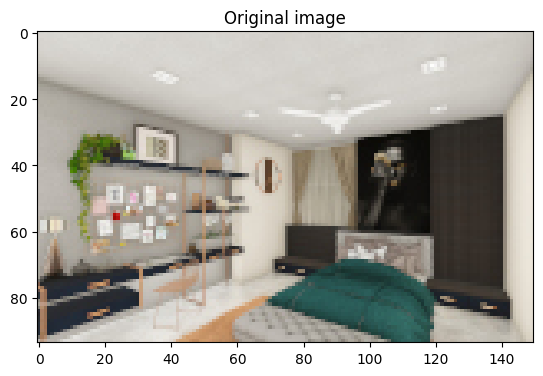

In [ ]:
image_file = 'content/image3D_150.jpg'
image=plt.imread(image_file)
plt.title("Original image")
plt.imshow(image)
plt.show()

<ipython-input-29-fecd826f7abc>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-29-fecd826f7abc>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


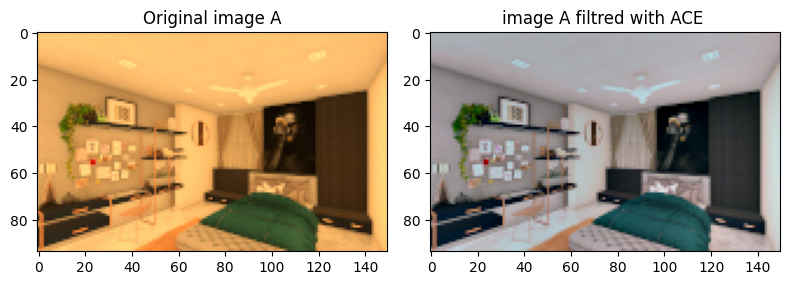

In [ ]:
image_fileA = 'content/image3D_A.jpg'
imageA=plt.imread(image_fileA)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(imageA)
plt.title("Original image A")

Rc = Rc_image(image_fileA, "euclidean", "saturation")
OcA = whiteGray_Oc(Rc)
plt.subplot(1, 2, 2)
plt.imshow(OcA)
plt.title("image A filtred with ACE ")

plt.tight_layout()
plt.show()


In [ ]:
image_array = (OcA * 255).astype(np.uint8)
image = Image.fromarray(image_array)

image.save("content/OcA.png")

<ipython-input-29-fecd826f7abc>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-29-fecd826f7abc>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


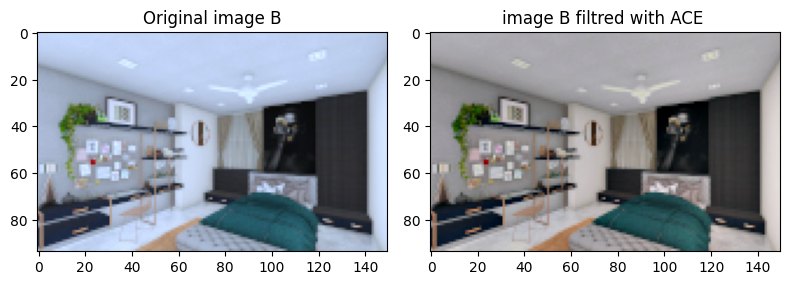

In [ ]:
image_fileB = 'content/image3D_B.jpg'
imageB=plt.imread(image_fileB)


plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(imageB)
plt.title("Original image B")

Rc = Rc_image(image_fileB, "euclidean", "saturation")
OcB = whiteGray_Oc(Rc)
plt.subplot(1, 2, 2)
plt.imshow(OcB)
plt.title("image B filtred with ACE ")

plt.tight_layout()
plt.show()

In [ ]:
image_array = (OcB * 255).astype(np.uint8)
image = Image.fromarray(image_array)

image.save("content/OcB.png")

<ipython-input-29-fecd826f7abc>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-29-fecd826f7abc>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


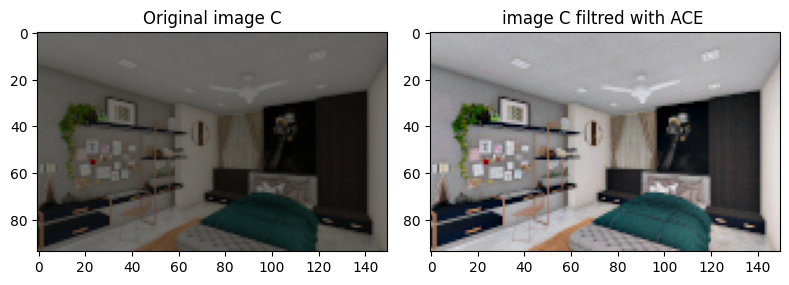

In [ ]:
image_fileD = 'content/image3D_D.jpg'
imageD=plt.imread(image_fileD)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(imageD)
plt.title("Original image C")

Rc = Rc_image(image_fileD, "euclidean", "saturation")
OcD = whiteGray_Oc(Rc)
plt.subplot(1, 2, 2)
plt.imshow(OcD)
plt.title("image C filtred with ACE ")

plt.tight_layout()
plt.show()

In [ ]:
image_array = (OcD * 255).astype(np.uint8)
image = Image.fromarray(image_array)

image.save("content/OcD.png")

$$
\text{DE}_{\text{mean}} = \frac{1}{\text{sizex} \times \text{sizey}} \sum_{p \in \text{Image}} \text{DE}(I_1(p), I_2(p))
$$


In [ ]:
def DE(image1, image2):
    stat1 = ImageStat.Stat(image1)
    stat2 = ImageStat.Stat(image2)
    delta_e = 0
    for i in range(3):
        delta_e += (stat1.mean[i] - stat2.mean[i]) ** 2
    delta_e = np.sqrt(delta_e)
    return delta_e

def mean_DE(image_names, image_paths):
    distance_dict = {}
    # Calculer les distances DE et les stocker dans le dictionnaire
    for i in range(len(image_names)):
        for j in range(i + 1, len(image_names)):
            image1 = Image.open(image_paths[i])
            image2 = Image.open(image_paths[j])
            mean_distance = DE(image1, image2)
            distance_dict[f'{image_names[i]} - {image_names[j]}'] = mean_distance
            distance_dict[f'{image_names[j]} - {image_names[i]}'] = mean_distance

    # Afficher la matrice de distances DE
    print("Image", " ".join(image_names))
    for name1 in image_names:
        row = [name1]
        for name2 in image_names:
            if name1 == name2:
                row.append("0.0")
            else:
                row.append(f"{distance_dict.get(f'{name1} - {name2}', distance_dict[f'{name2} - {name1}']):.2f}")
        print(" ".join(row))


print("Mean DE on the original synthetic images")
image_names = ["A", "B", "C"]
image_paths = ["content/image3D_A.jpg", "content/image3D_B.jpg", "content/image3D_D.jpg"]
mean_DE(image_names, image_paths)


Mean DE on the original synthetic images
Image A B C
A 0.0 105.94 136.21
B 105.94 0.0 147.23
C 136.21 147.23 0.0


In [ ]:
# Liste des noms des images
print("Mean DEon the ACE filtered synthetic images")
image_names = ["A", "B", "C"]
# Chemins des fichiers des images après ACE
image_paths = ["content/OcA.png", "content/OcB.png", "content/OcD.png"]
mean_DE(image_names, image_paths)


Mean DEon the ACE filtered synthetic images
Image A B C
A 0.0 4.52 3.97
B 4.52 0.0 0.81
C 3.97 0.81 0.0


### 3.3. Contrast modification

<ipython-input-29-fecd826f7abc>:17: RuntimeWarning: invalid value encountered in divide
  numerators = (r(I[p0, p1] - I[j0, j1], r_name) / d(dx_p_j, dy_p_j, distance))[mask]
<ipython-input-29-fecd826f7abc>:18: RuntimeWarning: divide by zero encountered in divide
  denominators = (rmax(r_name) / d(dx_p_j, dy_p_j, distance))[mask]


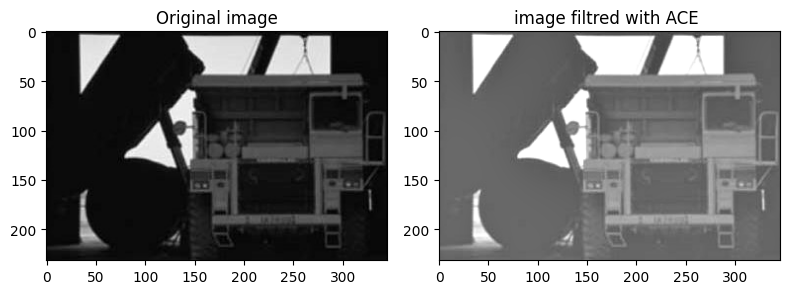

In [ ]:
image_file = 'content/image-014.jpg'
image=plt.imread(image_file)
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Original image")

Rc = Rc_image(image_file, "euclidean", "saturation")
Oc = whiteGray_Oc(Rc)
plt.subplot(1, 2, 2)
plt.imshow(Oc)
plt.title("image filtred with ACE ")

plt.tight_layout()
plt.show()

## Conclusion
From the results obtained, we can conclude that the ACE algorithm is extremely useful for color correction.
However, both the spatial and temporal complexity of the algorithm are very high, and an attempt has been made to optimize this by using as few loops as possible in the algorithm and by considering subsets of the image.
But there are other improvements that can be considered for this problem, such as polynomial approximation, which consists in performing a polynomial estimate for the slope function.